In [55]:
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image
import keras
from keras.models import Model
from keras.layers import ELU, PReLU, LeakyReLU
from keras.layers import Conv2D, MaxPooling2D, Input, Conv2DTranspose, Concatenate, BatchNormalization, UpSampling2D
from keras.layers import  Dropout, Activation
from keras.optimizers import Adam, SGD
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from keras import backend as K
from keras.utils import plot_model
import tensorflow as tf
import glob
import random
import cv2
from random import shuffle

In [56]:
def mean_iou(y_true, y_pred):
    # Extract first channel and ensure both tensors are float32
    yt0 = tf.cast(y_true[:,:,:,0], tf.float32)
    yp0 = tf.cast(y_pred[:,:,:,0] > 0.5, tf.float32)
    
    # Calculate intersection and union using reduce_sum instead of count_nonzero
    # for better numerical stability and batch processing
    intersection = tf.reduce_sum(yt0 * yp0, axis=[1, 2])
    union = tf.reduce_sum(tf.clip_by_value(yt0 + yp0, 0, 1), axis=[1, 2])
    
    # Calculate IoU with proper handling of division by zero
    iou = tf.where(tf.equal(union, 0), 
                   tf.ones_like(union), 
                   intersection / union)
    
    # Return mean IoU across the batch
    return tf.reduce_mean(iou)


In [57]:
def unet(sz = (512, 512, 3)):
  x = Input(sz)
  inputs = x
  
  #down sampling 
  f = 8
  # f=4
  layers = []
  
  for i in range(0, 6):
    x = Conv2D(f, 3, activation='relu', padding='same') (x)
    x = Conv2D(f, 3, activation='relu', padding='same') (x)
    layers.append(x)
    x = MaxPooling2D() (x)
    f = f*2
  ff2 = 64 
  
  #bottleneck 
  j = len(layers) - 1
  x = Conv2D(f, 3, activation='relu', padding='same') (x)
  x = Conv2D(f, 3, activation='relu', padding='same') (x)
  x = Conv2DTranspose(ff2, 2, strides=(2, 2), padding='same') (x)
  x = Concatenate(axis=3)([x, layers[j]])
  j = j -1 
  
  #upsampling 
  for i in range(0, 5):
    ff2 = ff2//2
    f = f // 2 
    x = Conv2D(f, 3, activation='relu', padding='same') (x)
    x = Conv2D(f, 3, activation='relu', padding='same') (x)
    x = Conv2DTranspose(ff2, 2, strides=(2, 2), padding='same') (x)
    x = Concatenate(axis=3)([x, layers[j]])
    j = j -1 
    
  
  #classification 
  x = Conv2D(f, 3, activation='relu', padding='same') (x)
  x = Conv2D(f, 3, activation='relu', padding='same') (x)
  outputs = Conv2D(1, 1, activation='sigmoid') (x)
  
  #model creation 
  model = Model(inputs=[inputs], outputs=[outputs])
  model.compile(optimizer = 'rmsprop', loss = 'binary_crossentropy', metrics = [mean_iou])
  
  return model

In [58]:
model = unet()

In [59]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import keras
from keras.callbacks import ModelCheckpoint

def build_callbacks():
    checkpointer = ModelCheckpoint(filepath='unet.weights.h5', verbose=0, save_best_only=True, save_weights_only=True)
    callbacks = [checkpointer, PlotLearning()]
    return callbacks

# inheritance for training process plot 
class PlotLearning(keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.i = 0
        self.x = []
        self.losses = []
        self.val_losses = []
        self.acc = []
        self.val_acc = []
        #self.fig = plt.figure()
        self.logs = []
    
    def on_epoch_end(self, epoch, logs={}):
        self.logs.append(logs)
        self.x.append(self.i)
        self.losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))
        self.acc.append(logs.get('mean_iou'))
        self.val_acc.append(logs.get('val_mean_iou'))
        self.i += 1
        print('i=',self.i,'loss=',logs.get('loss'),'val_loss=',logs.get('val_loss'),'mean_iou=',logs.get('mean_iou'),'val_mean_iou=',logs.get('val_mean_iou'))
        
        # Choose a random test image and preprocess
        # Use the correct variable name and path structure
        path = np.random.choice(test_images)
        raw = Image.open(path)  # Use the full path directly
        raw = np.array(raw.resize((512, 512)))/255.
        raw = raw[:,:,0:3]
        
        # Predict the mask 
        pred = model.predict(np.expand_dims(raw, 0))
        
        # Mask post-processing 
        msk = pred.squeeze()
        msk = np.stack((msk,)*3, axis=-1)
        msk[msk >= 0.5] = 1 
        msk[msk < 0.5] = 0 
        
        # Show the mask and the segmented image 
        combined = np.concatenate([raw, msk, raw * msk], axis=1)
        plt.axis('off')
        plt.imshow(combined)
        plt.show()

In [60]:
import os
from glob import glob
from PIL import Image
import numpy as np

# Base path of dataset
base_path = "FloodNet-Supervised_v1.0"

# Load file paths directly from folders
train_images = sorted(glob(os.path.join(base_path, "train", "train-org-img", "*.jpg")))
train_masks  = sorted(glob(os.path.join(base_path, "train", "train-label-img", "*.png")))

val_images = sorted(glob(os.path.join(base_path, "val", "val-org-img", "*.jpg")))
val_masks  = sorted(glob(os.path.join(base_path, "val", "val-label-img", "*.png")))

test_images = sorted(glob(os.path.join(base_path, "test", "test-org-img", "*.jpg")))
test_masks  = sorted(glob(os.path.join(base_path, "test", "test-label-img", "*.png")))


In [61]:
from PIL import Image
import numpy as np

mask = Image.open("FloodNet-Supervised_v1.0/test/test-label-img/6342_lab.png")
mask_np = np.array(mask)
print("Mask shape:", mask_np.shape)
print("Unique pixel values:", np.unique(mask_np))


Mask shape: (3000, 4000)
Unique pixel values: [4 5 9]


In [62]:
def supervised_generator(image_files, mask_files, batch_size=8, size=(512, 512)):
    flood_labels = [1, 3,5]  

    while True:
        idx = np.random.choice(len(image_files), batch_size)
        batch_x, batch_y = [], []

        for i in idx:
            img = Image.open(image_files[i]).resize(size)
            mask = Image.open(mask_files[i]).resize(size)

            img = np.array(img)
            mask = np.array(mask)

            # Convert multi-class mask to binary mask (1 = flood, 0 = not flood)
            binary_mask = np.isin(mask, flood_labels).astype(np.uint8)
            binary_mask = np.expand_dims(binary_mask, axis=-1)

            # Normalize image
            if img.ndim == 2:
                img = np.stack([img]*3, axis=-1)
            else:
                img = img[:, :, :3]
            img = img / 255.0

            batch_x.append(img)
            batch_y.append(binary_mask)

        yield np.array(batch_x), np.array(batch_y)


# Define generators
train_gen = supervised_generator(train_images, train_masks)
val_gen = supervised_generator(val_images, val_masks)
test_gen = supervised_generator(test_images, test_masks)


In [63]:
import tensorflow as tf

def dice_loss(y_true, y_pred, smooth=1e-6):
    # Flatten the masks
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f)
    
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - dice


In [64]:
def combined_loss(y_true, y_pred):
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    dsc = dice_loss(y_true, y_pred)
    return bce + dsc


Epoch 1/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.8389 - loss: 1.4160 - mean_iou: 0.1107i= 1 loss= 1.394096851348877 val_loss= 1.2844080924987793 mean_iou= 0.15376563370227814 val_mean_iou= 0.13750000298023224
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


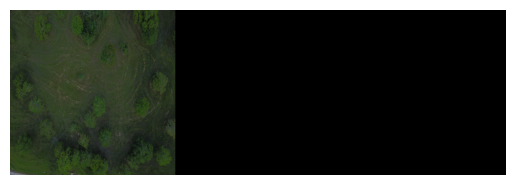

100/100 ━━━━━━━━━━━━━━━━━━━━ 461s 4s/step - accuracy: 0.8390 - loss: 1.4158 - mean_iou: 0.1112 - val_accuracy: 0.8774 - val_loss: 1.2844 - val_mean_iou: 0.1375
Epoch 2/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.8345 - loss: 1.3008 - mean_iou: 0.1982i= 2 loss= 1.300621509552002 val_loss= 1.276867151260376 mean_iou= 0.1875 val_mean_iou= 0.11249999701976776
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


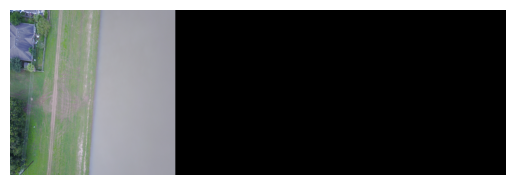

100/100 ━━━━━━━━━━━━━━━━━━━━ 451s 5s/step - accuracy: 0.8345 - loss: 1.3008 - mean_iou: 0.1981 - val_accuracy: 0.8404 - val_loss: 1.2769 - val_mean_iou: 0.1125
Epoch 3/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.8351 - loss: 1.2732 - mean_iou: 0.1636i= 3 loss= 1.2590032815933228 val_loss= 1.2674429416656494 mean_iou= 0.1850000023841858 val_mean_iou= 0.13124999403953552
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


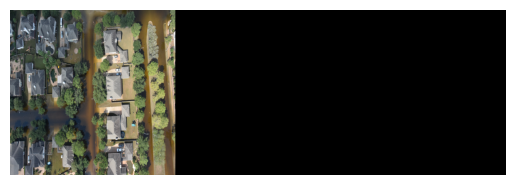

100/100 ━━━━━━━━━━━━━━━━━━━━ 430s 4s/step - accuracy: 0.8352 - loss: 1.2731 - mean_iou: 0.1638 - val_accuracy: 0.8331 - val_loss: 1.2674 - val_mean_iou: 0.1312
Epoch 4/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.8326 - loss: 1.2363 - mean_iou: 0.1798i= 4 loss= 1.2197476625442505 val_loss= 1.1869587898254395 mean_iou= 0.18250000476837158 val_mean_iou= 0.18125000596046448
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


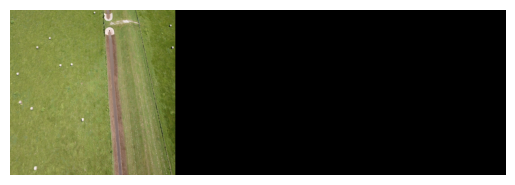

100/100 ━━━━━━━━━━━━━━━━━━━━ 415s 4s/step - accuracy: 0.8328 - loss: 1.2362 - mean_iou: 0.1799 - val_accuracy: 0.8535 - val_loss: 1.1870 - val_mean_iou: 0.1813
Epoch 5/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.8444 - loss: 1.1503 - mean_iou: 0.1712i= 5 loss= 1.1141386032104492 val_loss= 1.070342779159546 mean_iou= 0.17000000178813934 val_mean_iou= 0.14374999701976776
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


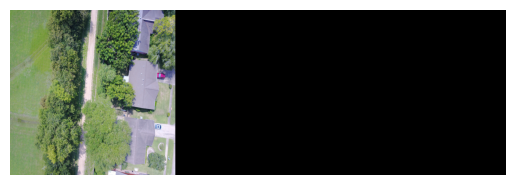

100/100 ━━━━━━━━━━━━━━━━━━━━ 418s 4s/step - accuracy: 0.8444 - loss: 1.1499 - mean_iou: 0.1712 - val_accuracy: 0.8315 - val_loss: 1.0703 - val_mean_iou: 0.1437
Epoch 6/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.8530 - loss: 1.0425 - mean_iou: 0.2016i= 6 loss= 1.0630948543548584 val_loss= 1.060341477394104 mean_iou= 0.1912499964237213 val_mean_iou= 0.13124999403953552
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


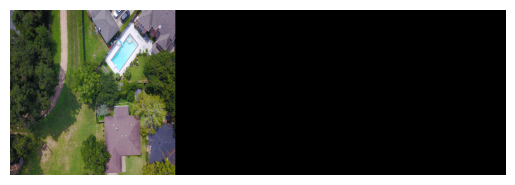

100/100 ━━━━━━━━━━━━━━━━━━━━ 417s 4s/step - accuracy: 0.8529 - loss: 1.0427 - mean_iou: 0.2015 - val_accuracy: 0.8308 - val_loss: 1.0603 - val_mean_iou: 0.1312
Epoch 7/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.8346 - loss: 1.0821 - mean_iou: 0.1532i= 7 loss= 1.0744426250457764 val_loss= 1.0389344692230225 mean_iou= 0.16500042378902435 val_mean_iou= 0.16875000298023224
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


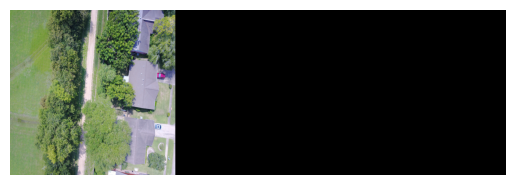

100/100 ━━━━━━━━━━━━━━━━━━━━ 424s 4s/step - accuracy: 0.8346 - loss: 1.0820 - mean_iou: 0.1533 - val_accuracy: 0.8526 - val_loss: 1.0389 - val_mean_iou: 0.1688
Epoch 8/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8523 - loss: 0.9890 - mean_iou: 0.2055i= 8 loss= 0.9988770484924316 val_loss= 1.0382601022720337 mean_iou= 0.22193819284439087 val_mean_iou= 0.27591150999069214
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step


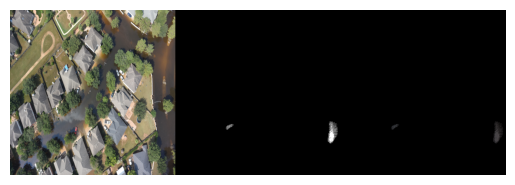

100/100 ━━━━━━━━━━━━━━━━━━━━ 343s 3s/step - accuracy: 0.8523 - loss: 0.9890 - mean_iou: 0.2057 - val_accuracy: 0.8671 - val_loss: 1.0383 - val_mean_iou: 0.2759
Epoch 9/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8722 - loss: 0.9650 - mean_iou: 0.3315i= 9 loss= 0.9849079847335815 val_loss= 1.0451133251190186 mean_iou= 0.3435782194137573 val_mean_iou= 0.3272641897201538
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


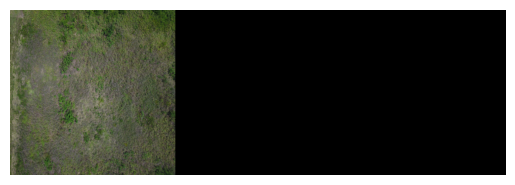

100/100 ━━━━━━━━━━━━━━━━━━━━ 357s 4s/step - accuracy: 0.8720 - loss: 0.9652 - mean_iou: 0.3316 - val_accuracy: 0.8596 - val_loss: 1.0451 - val_mean_iou: 0.3273
Epoch 10/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.8763 - loss: 0.9727 - mean_iou: 0.3628i= 10 loss= 0.9804611206054688 val_loss= 1.0014958381652832 mean_iou= 0.3519347012042999 val_mean_iou= 0.3406551778316498
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


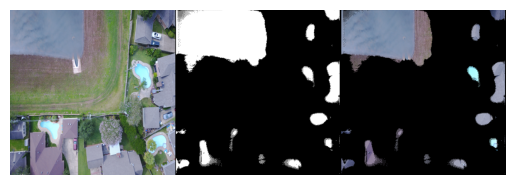

100/100 ━━━━━━━━━━━━━━━━━━━━ 421s 4s/step - accuracy: 0.8762 - loss: 0.9728 - mean_iou: 0.3627 - val_accuracy: 0.8758 - val_loss: 1.0015 - val_mean_iou: 0.3407
Epoch 11/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.8853 - loss: 0.9968 - mean_iou: 0.3484i= 11 loss= 0.9836867451667786 val_loss= 0.938045859336853 mean_iou= 0.3562338948249817 val_mean_iou= 0.4188845753669739
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


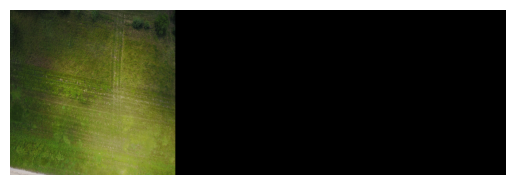

100/100 ━━━━━━━━━━━━━━━━━━━━ 434s 4s/step - accuracy: 0.8853 - loss: 0.9966 - mean_iou: 0.3485 - val_accuracy: 0.8566 - val_loss: 0.9380 - val_mean_iou: 0.4189
Epoch 12/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8691 - loss: 0.9394 - mean_iou: 0.3807i= 12 loss= 0.9458702802658081 val_loss= 1.0724941492080688 mean_iou= 0.3475329279899597 val_mean_iou= 0.2941647469997406
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


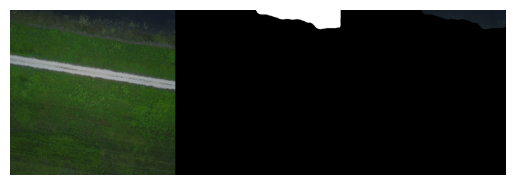

100/100 ━━━━━━━━━━━━━━━━━━━━ 326s 3s/step - accuracy: 0.8691 - loss: 0.9395 - mean_iou: 0.3804 - val_accuracy: 0.8586 - val_loss: 1.0725 - val_mean_iou: 0.2942
Epoch 13/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8634 - loss: 0.9579 - mean_iou: 0.3246i= 13 loss= 0.9454010725021362 val_loss= 0.9859094619750977 mean_iou= 0.36427468061447144 val_mean_iou= 0.31097322702407837
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


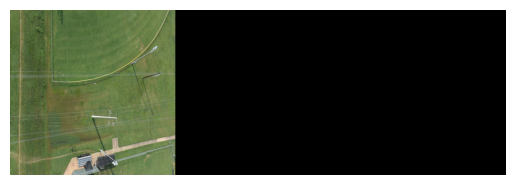

100/100 ━━━━━━━━━━━━━━━━━━━━ 316s 3s/step - accuracy: 0.8635 - loss: 0.9577 - mean_iou: 0.3250 - val_accuracy: 0.8888 - val_loss: 0.9859 - val_mean_iou: 0.3110
Epoch 14/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9020 - loss: 0.7941 - mean_iou: 0.3545i= 14 loss= 0.7718796730041504 val_loss= 0.8277760744094849 mean_iou= 0.37333840131759644 val_mean_iou= 0.343927264213562
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


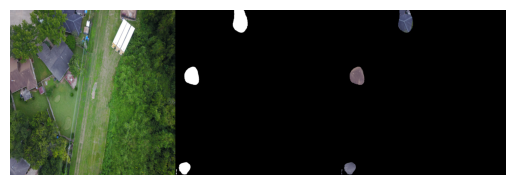

100/100 ━━━━━━━━━━━━━━━━━━━━ 314s 3s/step - accuracy: 0.9020 - loss: 0.7938 - mean_iou: 0.3547 - val_accuracy: 0.8828 - val_loss: 0.8278 - val_mean_iou: 0.3439
Epoch 15/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8990 - loss: 0.7577 - mean_iou: 0.3698i= 15 loss= 0.7521122097969055 val_loss= 0.8634311556816101 mean_iou= 0.3646242022514343 val_mean_iou= 0.3694465756416321
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


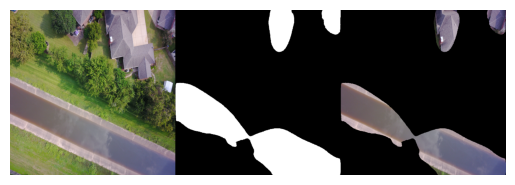

100/100 ━━━━━━━━━━━━━━━━━━━━ 314s 3s/step - accuracy: 0.8990 - loss: 0.7577 - mean_iou: 0.3698 - val_accuracy: 0.8731 - val_loss: 0.8634 - val_mean_iou: 0.3694
Epoch 16/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9083 - loss: 0.6262 - mean_iou: 0.4396i= 16 loss= 0.6402336359024048 val_loss= 0.7122761607170105 mean_iou= 0.43693000078201294 val_mean_iou= 0.46982064843177795
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


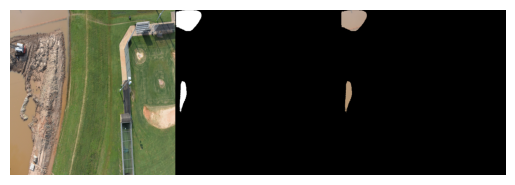

100/100 ━━━━━━━━━━━━━━━━━━━━ 316s 3s/step - accuracy: 0.9083 - loss: 0.6263 - mean_iou: 0.4396 - val_accuracy: 0.8946 - val_loss: 0.7123 - val_mean_iou: 0.4698
Epoch 17/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9113 - loss: 0.6450 - mean_iou: 0.4144i= 17 loss= 0.6719490885734558 val_loss= 0.8232948184013367 mean_iou= 0.3862139582633972 val_mean_iou= 0.37592729926109314
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


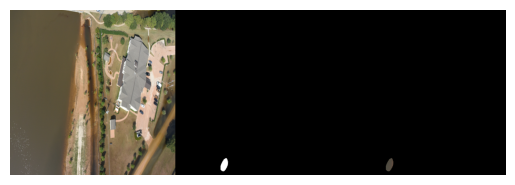

100/100 ━━━━━━━━━━━━━━━━━━━━ 314s 3s/step - accuracy: 0.9113 - loss: 0.6452 - mean_iou: 0.4141 - val_accuracy: 0.9055 - val_loss: 0.8233 - val_mean_iou: 0.3759
Epoch 18/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9078 - loss: 0.7034 - mean_iou: 0.4089i= 18 loss= 0.6502693295478821 val_loss= 0.759497344493866 mean_iou= 0.41868096590042114 val_mean_iou= 0.41340336203575134
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


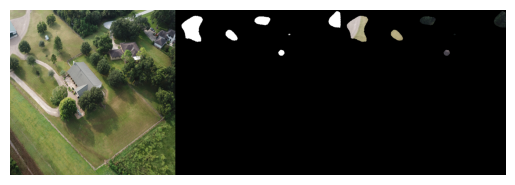

100/100 ━━━━━━━━━━━━━━━━━━━━ 315s 3s/step - accuracy: 0.9079 - loss: 0.7029 - mean_iou: 0.4090 - val_accuracy: 0.8908 - val_loss: 0.7595 - val_mean_iou: 0.4134
Epoch 19/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9088 - loss: 0.6172 - mean_iou: 0.4380i= 19 loss= 0.5904080867767334 val_loss= 0.6363385915756226 mean_iou= 0.4444761276245117 val_mean_iou= 0.4073631763458252
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


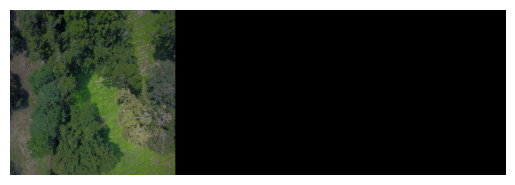

100/100 ━━━━━━━━━━━━━━━━━━━━ 315s 3s/step - accuracy: 0.9089 - loss: 0.6169 - mean_iou: 0.4381 - val_accuracy: 0.9060 - val_loss: 0.6363 - val_mean_iou: 0.4074
Epoch 20/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9298 - loss: 0.5955 - mean_iou: 0.3889i= 20 loss= 0.583034336566925 val_loss= 0.6522009968757629 mean_iou= 0.41522887349128723 val_mean_iou= 0.4090513288974762
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


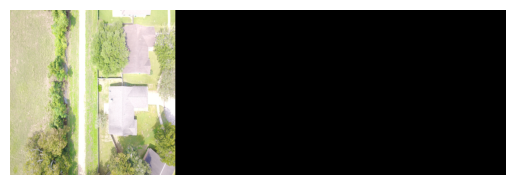

100/100 ━━━━━━━━━━━━━━━━━━━━ 317s 3s/step - accuracy: 0.9298 - loss: 0.5953 - mean_iou: 0.3892 - val_accuracy: 0.8992 - val_loss: 0.6522 - val_mean_iou: 0.4091
Epoch 21/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9184 - loss: 0.5866 - mean_iou: 0.4368i= 21 loss= 0.561657190322876 val_loss= 0.7414299249649048 mean_iou= 0.44829261302948 val_mean_iou= 0.4586745798587799
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


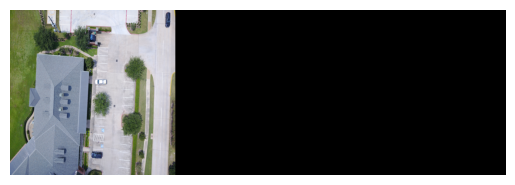

100/100 ━━━━━━━━━━━━━━━━━━━━ 315s 3s/step - accuracy: 0.9185 - loss: 0.5863 - mean_iou: 0.4369 - val_accuracy: 0.9074 - val_loss: 0.7414 - val_mean_iou: 0.4587
Epoch 22/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9240 - loss: 0.5521 - mean_iou: 0.4383i= 22 loss= 0.551070511341095 val_loss= 0.7201564908027649 mean_iou= 0.4486669600009918 val_mean_iou= 0.40111327171325684
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


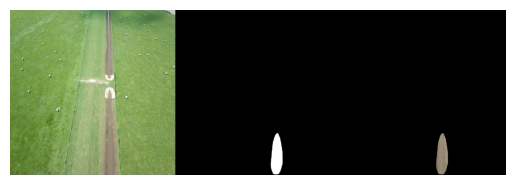

100/100 ━━━━━━━━━━━━━━━━━━━━ 315s 3s/step - accuracy: 0.9240 - loss: 0.5521 - mean_iou: 0.4384 - val_accuracy: 0.9069 - val_loss: 0.7202 - val_mean_iou: 0.4011
Epoch 23/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9238 - loss: 0.5594 - mean_iou: 0.4886i= 23 loss= 0.5429682731628418 val_loss= 0.5629775524139404 mean_iou= 0.4706270694732666 val_mean_iou= 0.4804743826389313
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


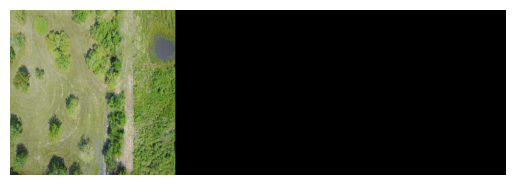

100/100 ━━━━━━━━━━━━━━━━━━━━ 316s 3s/step - accuracy: 0.9238 - loss: 0.5593 - mean_iou: 0.4885 - val_accuracy: 0.9137 - val_loss: 0.5630 - val_mean_iou: 0.4805
Epoch 24/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9330 - loss: 0.5132 - mean_iou: 0.4849i= 24 loss= 0.5390266180038452 val_loss= 0.6966806650161743 mean_iou= 0.47444096207618713 val_mean_iou= 0.43769580125808716
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


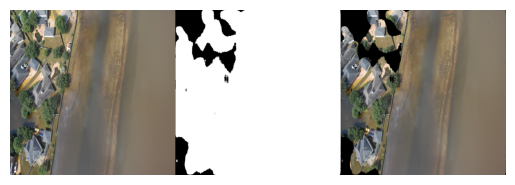

100/100 ━━━━━━━━━━━━━━━━━━━━ 314s 3s/step - accuracy: 0.9329 - loss: 0.5135 - mean_iou: 0.4848 - val_accuracy: 0.8850 - val_loss: 0.6967 - val_mean_iou: 0.4377
Epoch 25/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9163 - loss: 0.5613 - mean_iou: 0.4699i= 25 loss= 0.5436656475067139 val_loss= 0.7640234231948853 mean_iou= 0.45307987928390503 val_mean_iou= 0.42473673820495605
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


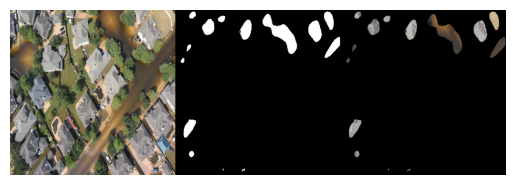

100/100 ━━━━━━━━━━━━━━━━━━━━ 314s 3s/step - accuracy: 0.9164 - loss: 0.5611 - mean_iou: 0.4697 - val_accuracy: 0.9056 - val_loss: 0.7640 - val_mean_iou: 0.4247
Epoch 26/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9221 - loss: 0.5564 - mean_iou: 0.4488i= 26 loss= 0.5652609467506409 val_loss= 0.6061754822731018 mean_iou= 0.4603707492351532 val_mean_iou= 0.39489060640335083
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


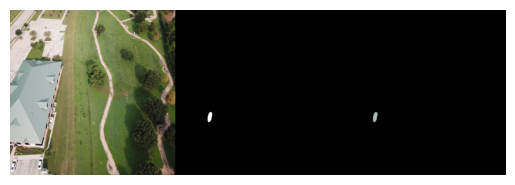

100/100 ━━━━━━━━━━━━━━━━━━━━ 315s 3s/step - accuracy: 0.9221 - loss: 0.5565 - mean_iou: 0.4489 - val_accuracy: 0.8964 - val_loss: 0.6062 - val_mean_iou: 0.3949
Epoch 27/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9317 - loss: 0.5292 - mean_iou: 0.4725i= 27 loss= 0.5170609951019287 val_loss= 0.6389467716217041 mean_iou= 0.46390438079833984 val_mean_iou= 0.3904661536216736
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


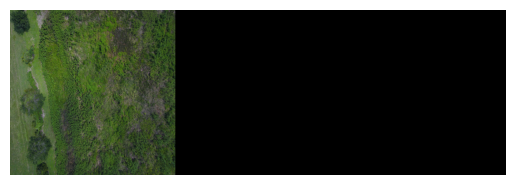

100/100 ━━━━━━━━━━━━━━━━━━━━ 314s 3s/step - accuracy: 0.9317 - loss: 0.5291 - mean_iou: 0.4724 - val_accuracy: 0.8989 - val_loss: 0.6389 - val_mean_iou: 0.3905
Epoch 28/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9176 - loss: 0.5475 - mean_iou: 0.4531i= 28 loss= 0.4997375011444092 val_loss= 0.6073307991027832 mean_iou= 0.4816601574420929 val_mean_iou= 0.48127979040145874
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


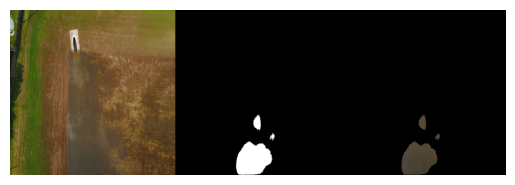

100/100 ━━━━━━━━━━━━━━━━━━━━ 314s 3s/step - accuracy: 0.9177 - loss: 0.5470 - mean_iou: 0.4534 - val_accuracy: 0.9163 - val_loss: 0.6073 - val_mean_iou: 0.4813
Epoch 29/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9318 - loss: 0.4792 - mean_iou: 0.4597i= 29 loss= 0.48754259943962097 val_loss= 0.6643913984298706 mean_iou= 0.4714473783969879 val_mean_iou= 0.42997097969055176
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


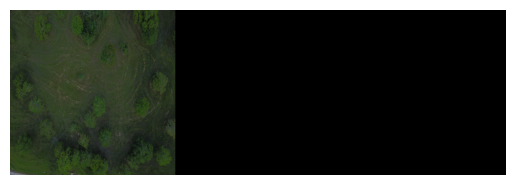

100/100 ━━━━━━━━━━━━━━━━━━━━ 319s 3s/step - accuracy: 0.9318 - loss: 0.4793 - mean_iou: 0.4598 - val_accuracy: 0.9094 - val_loss: 0.6644 - val_mean_iou: 0.4300
Epoch 30/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9436 - loss: 0.4634 - mean_iou: 0.4989i= 30 loss= 0.4462459683418274 val_loss= 0.6893381476402283 mean_iou= 0.5020174980163574 val_mean_iou= 0.43162423372268677
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


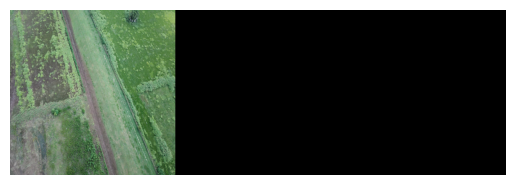

100/100 ━━━━━━━━━━━━━━━━━━━━ 318s 3s/step - accuracy: 0.9435 - loss: 0.4632 - mean_iou: 0.4990 - val_accuracy: 0.9110 - val_loss: 0.6893 - val_mean_iou: 0.4316
Epoch 31/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9328 - loss: 0.4754 - mean_iou: 0.4912i= 31 loss= 0.4628255367279053 val_loss= 0.6209717988967896 mean_iou= 0.5065428018569946 val_mean_iou= 0.4240162968635559
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


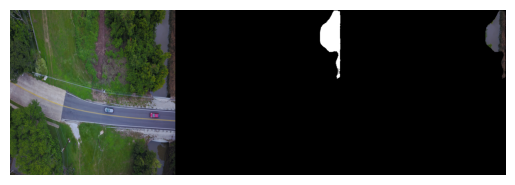

100/100 ━━━━━━━━━━━━━━━━━━━━ 313s 3s/step - accuracy: 0.9328 - loss: 0.4753 - mean_iou: 0.4914 - val_accuracy: 0.9150 - val_loss: 0.6210 - val_mean_iou: 0.4240
Epoch 32/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9501 - loss: 0.4266 - mean_iou: 0.4757i= 32 loss= 0.43815699219703674 val_loss= 0.6037718057632446 mean_iou= 0.48867854475975037 val_mean_iou= 0.4955039620399475
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


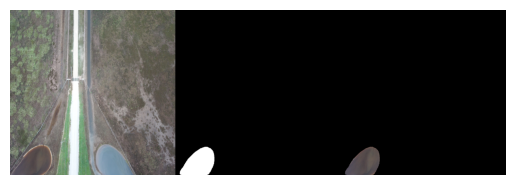

100/100 ━━━━━━━━━━━━━━━━━━━━ 317s 3s/step - accuracy: 0.9501 - loss: 0.4267 - mean_iou: 0.4758 - val_accuracy: 0.9218 - val_loss: 0.6038 - val_mean_iou: 0.4955
Epoch 33/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9372 - loss: 0.4124 - mean_iou: 0.5223i= 33 loss= 0.47904765605926514 val_loss= 0.6098693609237671 mean_iou= 0.5064382553100586 val_mean_iou= 0.4852287769317627
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


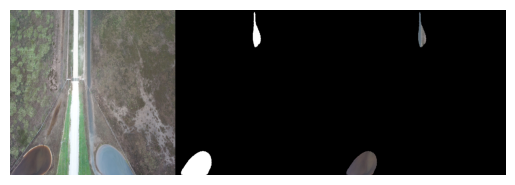

100/100 ━━━━━━━━━━━━━━━━━━━━ 316s 3s/step - accuracy: 0.9371 - loss: 0.4130 - mean_iou: 0.5221 - val_accuracy: 0.9140 - val_loss: 0.6099 - val_mean_iou: 0.4852
Epoch 34/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9379 - loss: 0.4612 - mean_iou: 0.5383i= 34 loss= 0.44452965259552 val_loss= 0.6155936121940613 mean_iou= 0.5295431017875671 val_mean_iou= 0.44982680678367615
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


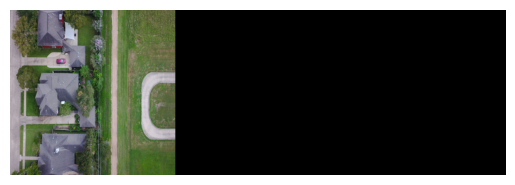

100/100 ━━━━━━━━━━━━━━━━━━━━ 316s 3s/step - accuracy: 0.9379 - loss: 0.4610 - mean_iou: 0.5382 - val_accuracy: 0.9113 - val_loss: 0.6156 - val_mean_iou: 0.4498
Epoch 35/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9360 - loss: 0.4795 - mean_iou: 0.4866i= 35 loss= 0.4629715085029602 val_loss= 0.6306665539741516 mean_iou= 0.4979914128780365 val_mean_iou= 0.42988887429237366
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


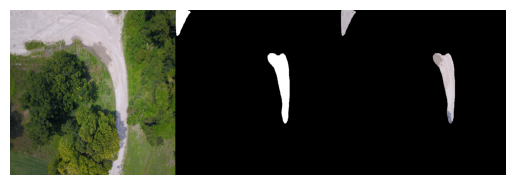

100/100 ━━━━━━━━━━━━━━━━━━━━ 314s 3s/step - accuracy: 0.9360 - loss: 0.4793 - mean_iou: 0.4867 - val_accuracy: 0.9023 - val_loss: 0.6307 - val_mean_iou: 0.4299
Epoch 36/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9400 - loss: 0.3889 - mean_iou: 0.5393i= 36 loss= 0.43078097701072693 val_loss= 0.5561782121658325 mean_iou= 0.5268747806549072 val_mean_iou= 0.48536476492881775
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


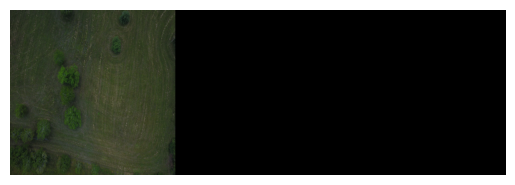

100/100 ━━━━━━━━━━━━━━━━━━━━ 317s 3s/step - accuracy: 0.9399 - loss: 0.3893 - mean_iou: 0.5391 - val_accuracy: 0.9087 - val_loss: 0.5562 - val_mean_iou: 0.4854
Epoch 37/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9350 - loss: 0.4641 - mean_iou: 0.4928i= 37 loss= 0.4394320547580719 val_loss= 0.6990644931793213 mean_iou= 0.49602898955345154 val_mean_iou= 0.3734644055366516
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


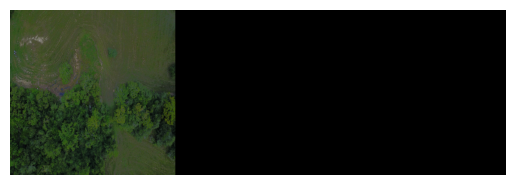

100/100 ━━━━━━━━━━━━━━━━━━━━ 323s 3s/step - accuracy: 0.9351 - loss: 0.4638 - mean_iou: 0.4928 - val_accuracy: 0.9168 - val_loss: 0.6991 - val_mean_iou: 0.3735
Epoch 38/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9466 - loss: 0.4276 - mean_iou: 0.4817i= 38 loss= 0.43150898814201355 val_loss= 0.4698943495750427 mean_iou= 0.47371333837509155 val_mean_iou= 0.518247663974762
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


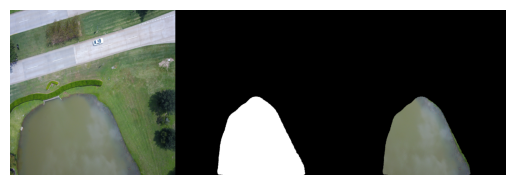

100/100 ━━━━━━━━━━━━━━━━━━━━ 318s 3s/step - accuracy: 0.9466 - loss: 0.4276 - mean_iou: 0.4816 - val_accuracy: 0.9325 - val_loss: 0.4699 - val_mean_iou: 0.5182
Epoch 39/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9437 - loss: 0.3855 - mean_iou: 0.5209i= 39 loss= 0.42548272013664246 val_loss= 0.5839580297470093 mean_iou= 0.5189430117607117 val_mean_iou= 0.4409274160861969
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


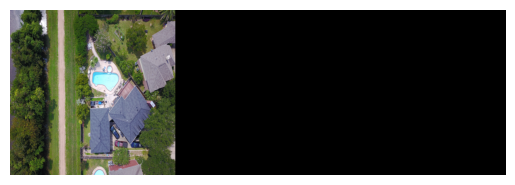

100/100 ━━━━━━━━━━━━━━━━━━━━ 314s 3s/step - accuracy: 0.9437 - loss: 0.3859 - mean_iou: 0.5209 - val_accuracy: 0.9296 - val_loss: 0.5840 - val_mean_iou: 0.4409
Epoch 40/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9426 - loss: 0.4261 - mean_iou: 0.5229i= 40 loss= 0.40278133749961853 val_loss= 0.6124225854873657 mean_iou= 0.5192052721977234 val_mean_iou= 0.44349128007888794
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


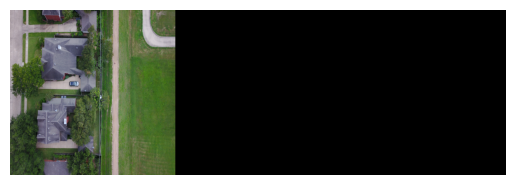

100/100 ━━━━━━━━━━━━━━━━━━━━ 315s 3s/step - accuracy: 0.9426 - loss: 0.4258 - mean_iou: 0.5228 - val_accuracy: 0.9074 - val_loss: 0.6124 - val_mean_iou: 0.4435
Epoch 41/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9359 - loss: 0.4429 - mean_iou: 0.5076i= 41 loss= 0.439975768327713 val_loss= 0.44060254096984863 mean_iou= 0.5157784819602966 val_mean_iou= 0.47822245955467224
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


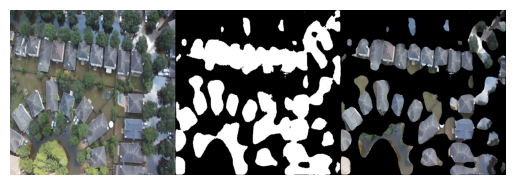

100/100 ━━━━━━━━━━━━━━━━━━━━ 318s 3s/step - accuracy: 0.9359 - loss: 0.4429 - mean_iou: 0.5076 - val_accuracy: 0.9346 - val_loss: 0.4406 - val_mean_iou: 0.4782
Epoch 42/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9433 - loss: 0.3843 - mean_iou: 0.5026i= 42 loss= 0.3722294270992279 val_loss= 0.5393577218055725 mean_iou= 0.5153984427452087 val_mean_iou= 0.4640941619873047
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


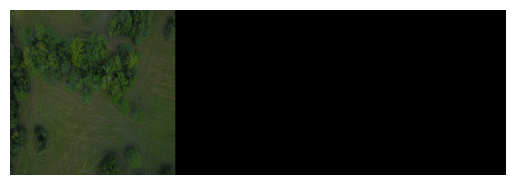

100/100 ━━━━━━━━━━━━━━━━━━━━ 317s 3s/step - accuracy: 0.9433 - loss: 0.3842 - mean_iou: 0.5027 - val_accuracy: 0.9153 - val_loss: 0.5394 - val_mean_iou: 0.4641
Epoch 43/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9505 - loss: 0.3475 - mean_iou: 0.5460i= 43 loss= 0.405966579914093 val_loss= 0.47839099168777466 mean_iou= 0.5150845050811768 val_mean_iou= 0.5178669095039368
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


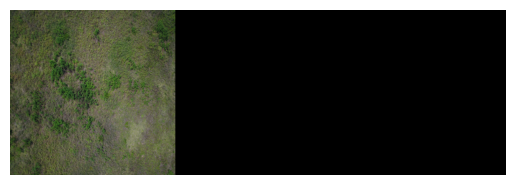

100/100 ━━━━━━━━━━━━━━━━━━━━ 313s 3s/step - accuracy: 0.9504 - loss: 0.3481 - mean_iou: 0.5457 - val_accuracy: 0.9301 - val_loss: 0.4784 - val_mean_iou: 0.5179
Epoch 44/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9384 - loss: 0.4431 - mean_iou: 0.4957i= 44 loss= 0.4358760416507721 val_loss= 0.5807548761367798 mean_iou= 0.49731945991516113 val_mean_iou= 0.4810214936733246
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


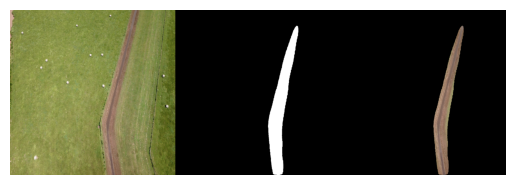

100/100 ━━━━━━━━━━━━━━━━━━━━ 333s 3s/step - accuracy: 0.9384 - loss: 0.4430 - mean_iou: 0.4957 - val_accuracy: 0.9156 - val_loss: 0.5808 - val_mean_iou: 0.4810
Epoch 45/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9421 - loss: 0.4107 - mean_iou: 0.5143i= 45 loss= 0.42269185185432434 val_loss= 0.5562095642089844 mean_iou= 0.5148000717163086 val_mean_iou= 0.4880405068397522
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


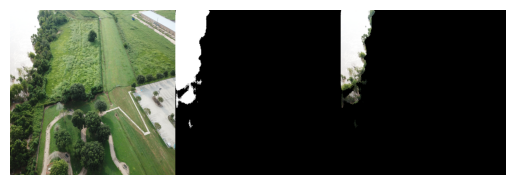

100/100 ━━━━━━━━━━━━━━━━━━━━ 389s 4s/step - accuracy: 0.9421 - loss: 0.4108 - mean_iou: 0.5143 - val_accuracy: 0.9219 - val_loss: 0.5562 - val_mean_iou: 0.4880
Epoch 46/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9474 - loss: 0.3711 - mean_iou: 0.5230i= 46 loss= 0.3738671541213989 val_loss= 0.47753992676734924 mean_iou= 0.5318306088447571 val_mean_iou= 0.5193602442741394
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


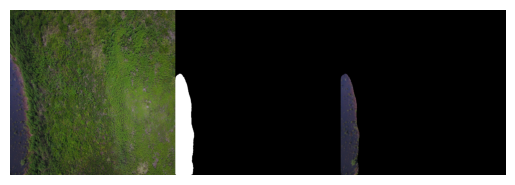

100/100 ━━━━━━━━━━━━━━━━━━━━ 315s 3s/step - accuracy: 0.9474 - loss: 0.3711 - mean_iou: 0.5231 - val_accuracy: 0.9352 - val_loss: 0.4775 - val_mean_iou: 0.5194
Epoch 47/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9381 - loss: 0.3905 - mean_iou: 0.5208i= 47 loss= 0.39784467220306396 val_loss= 0.48009824752807617 mean_iou= 0.4977470338344574 val_mean_iou= 0.5327380895614624
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


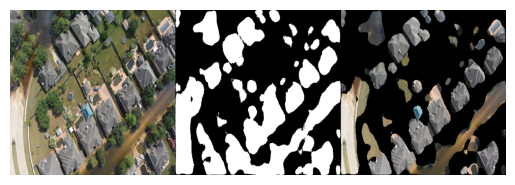

100/100 ━━━━━━━━━━━━━━━━━━━━ 317s 3s/step - accuracy: 0.9381 - loss: 0.3906 - mean_iou: 0.5206 - val_accuracy: 0.9356 - val_loss: 0.4801 - val_mean_iou: 0.5327
Epoch 48/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9493 - loss: 0.3563 - mean_iou: 0.5117i= 48 loss= 0.38602733612060547 val_loss= 0.5628065466880798 mean_iou= 0.5206396579742432 val_mean_iou= 0.4598473012447357
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


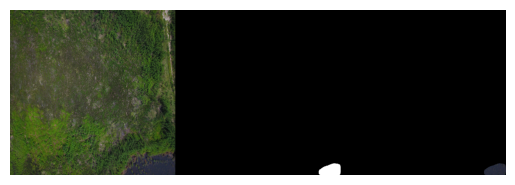

100/100 ━━━━━━━━━━━━━━━━━━━━ 315s 3s/step - accuracy: 0.9492 - loss: 0.3566 - mean_iou: 0.5118 - val_accuracy: 0.9113 - val_loss: 0.5628 - val_mean_iou: 0.4598
Epoch 49/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9463 - loss: 0.3799 - mean_iou: 0.5515i= 49 loss= 0.36192190647125244 val_loss= 0.5903317928314209 mean_iou= 0.549037516117096 val_mean_iou= 0.48556622862815857
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


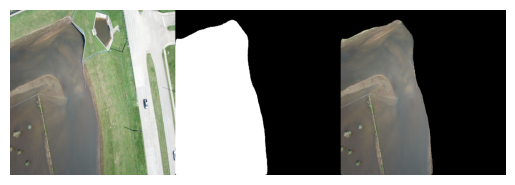

100/100 ━━━━━━━━━━━━━━━━━━━━ 315s 3s/step - accuracy: 0.9464 - loss: 0.3797 - mean_iou: 0.5514 - val_accuracy: 0.9164 - val_loss: 0.5903 - val_mean_iou: 0.4856
Epoch 50/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9531 - loss: 0.3109 - mean_iou: 0.5563i= 50 loss= 0.29647448658943176 val_loss= 0.4271315634250641 mean_iou= 0.5582998991012573 val_mean_iou= 0.5171993374824524
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


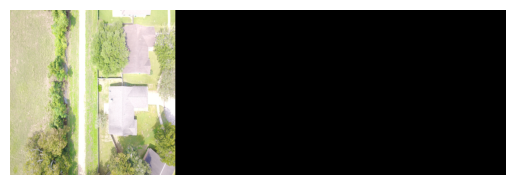

100/100 ━━━━━━━━━━━━━━━━━━━━ 318s 3s/step - accuracy: 0.9531 - loss: 0.3108 - mean_iou: 0.5563 - val_accuracy: 0.9462 - val_loss: 0.4271 - val_mean_iou: 0.5172
Epoch 51/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9421 - loss: 0.3788 - mean_iou: 0.5859i= 51 loss= 0.3799673914909363 val_loss= 0.4484669268131256 mean_iou= 0.544631838798523 val_mean_iou= 0.47294503450393677
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


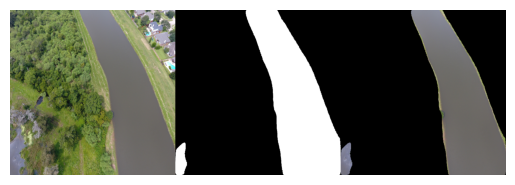

100/100 ━━━━━━━━━━━━━━━━━━━━ 315s 3s/step - accuracy: 0.9422 - loss: 0.3788 - mean_iou: 0.5855 - val_accuracy: 0.9392 - val_loss: 0.4485 - val_mean_iou: 0.4729
Epoch 52/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9515 - loss: 0.3498 - mean_iou: 0.5547i= 52 loss= 0.3409672677516937 val_loss= 0.45487722754478455 mean_iou= 0.5370110869407654 val_mean_iou= 0.515597403049469
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


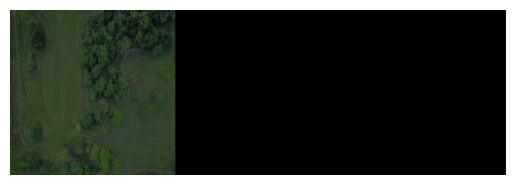

100/100 ━━━━━━━━━━━━━━━━━━━━ 314s 3s/step - accuracy: 0.9516 - loss: 0.3497 - mean_iou: 0.5545 - val_accuracy: 0.9439 - val_loss: 0.4549 - val_mean_iou: 0.5156
Epoch 53/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9560 - loss: 0.3191 - mean_iou: 0.5310i= 53 loss= 0.32607704401016235 val_loss= 0.5455842614173889 mean_iou= 0.5389925837516785 val_mean_iou= 0.5264201760292053
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


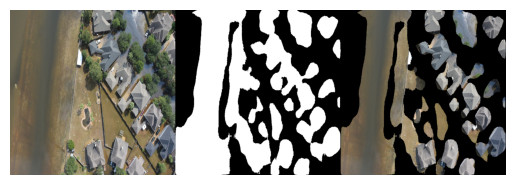

100/100 ━━━━━━━━━━━━━━━━━━━━ 314s 3s/step - accuracy: 0.9560 - loss: 0.3192 - mean_iou: 0.5311 - val_accuracy: 0.9298 - val_loss: 0.5456 - val_mean_iou: 0.5264
Epoch 54/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9555 - loss: 0.3210 - mean_iou: 0.5733i= 54 loss= 0.332894891500473 val_loss= 0.46607834100723267 mean_iou= 0.5593043565750122 val_mean_iou= 0.44356879591941833
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


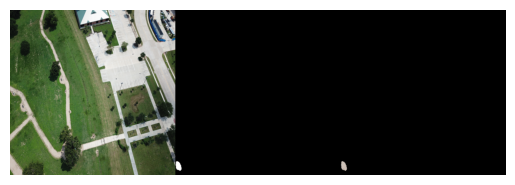

100/100 ━━━━━━━━━━━━━━━━━━━━ 314s 3s/step - accuracy: 0.9555 - loss: 0.3211 - mean_iou: 0.5732 - val_accuracy: 0.9372 - val_loss: 0.4661 - val_mean_iou: 0.4436
Epoch 55/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9597 - loss: 0.3500 - mean_iou: 0.4984i= 55 loss= 0.36086562275886536 val_loss= 0.48638981580734253 mean_iou= 0.5064568519592285 val_mean_iou= 0.4506581425666809
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


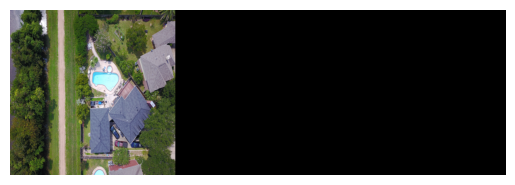

100/100 ━━━━━━━━━━━━━━━━━━━━ 314s 3s/step - accuracy: 0.9597 - loss: 0.3501 - mean_iou: 0.4984 - val_accuracy: 0.9278 - val_loss: 0.4864 - val_mean_iou: 0.4507
Epoch 56/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9433 - loss: 0.3925 - mean_iou: 0.5120i= 56 loss= 0.4024915397167206 val_loss= 0.46286025643348694 mean_iou= 0.5159558057785034 val_mean_iou= 0.4886644780635834
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


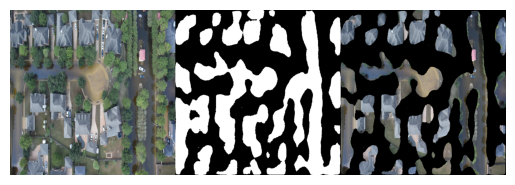

100/100 ━━━━━━━━━━━━━━━━━━━━ 407s 4s/step - accuracy: 0.9433 - loss: 0.3926 - mean_iou: 0.5120 - val_accuracy: 0.9356 - val_loss: 0.4629 - val_mean_iou: 0.4887
Epoch 57/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9601 - loss: 0.3119 - mean_iou: 0.5577i= 57 loss= 0.3191557824611664 val_loss= 0.6547883152961731 mean_iou= 0.5487962365150452 val_mean_iou= 0.47001776099205017
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


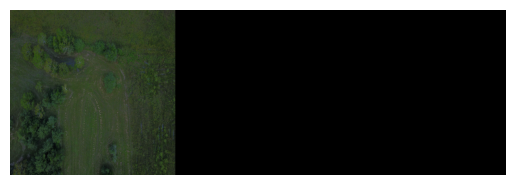

100/100 ━━━━━━━━━━━━━━━━━━━━ 409s 4s/step - accuracy: 0.9601 - loss: 0.3120 - mean_iou: 0.5576 - val_accuracy: 0.9050 - val_loss: 0.6548 - val_mean_iou: 0.4700
Epoch 58/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9542 - loss: 0.3212 - mean_iou: 0.5248i= 58 loss= 0.30713126063346863 val_loss= 0.5095325112342834 mean_iou= 0.5386983156204224 val_mean_iou= 0.518426775932312
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


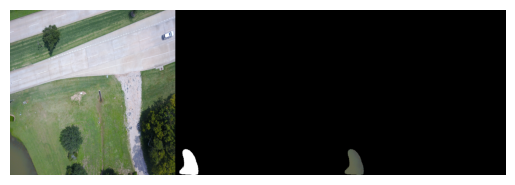

100/100 ━━━━━━━━━━━━━━━━━━━━ 410s 4s/step - accuracy: 0.9543 - loss: 0.3210 - mean_iou: 0.5249 - val_accuracy: 0.9225 - val_loss: 0.5095 - val_mean_iou: 0.5184
Epoch 59/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9572 - loss: 0.3102 - mean_iou: 0.5377i= 59 loss= 0.29805365204811096 val_loss= 0.5179507732391357 mean_iou= 0.5660722255706787 val_mean_iou= 0.5207725763320923
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


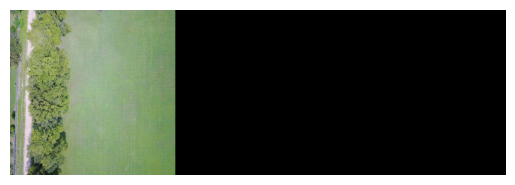

100/100 ━━━━━━━━━━━━━━━━━━━━ 413s 4s/step - accuracy: 0.9572 - loss: 0.3101 - mean_iou: 0.5380 - val_accuracy: 0.9265 - val_loss: 0.5180 - val_mean_iou: 0.5208
Epoch 60/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9552 - loss: 0.3291 - mean_iou: 0.5569i= 60 loss= 0.3226788341999054 val_loss= 0.5033553838729858 mean_iou= 0.5522462725639343 val_mean_iou= 0.5006822347640991
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


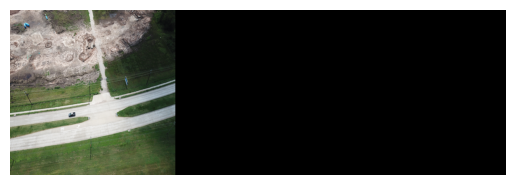

100/100 ━━━━━━━━━━━━━━━━━━━━ 376s 4s/step - accuracy: 0.9552 - loss: 0.3290 - mean_iou: 0.5568 - val_accuracy: 0.9314 - val_loss: 0.5034 - val_mean_iou: 0.5007
Epoch 61/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9583 - loss: 0.3107 - mean_iou: 0.5438i= 61 loss= 0.31354260444641113 val_loss= 0.4372398257255554 mean_iou= 0.5456891059875488 val_mean_iou= 0.5384328961372375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


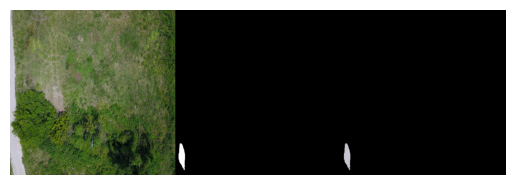

100/100 ━━━━━━━━━━━━━━━━━━━━ 367s 4s/step - accuracy: 0.9583 - loss: 0.3107 - mean_iou: 0.5438 - val_accuracy: 0.9370 - val_loss: 0.4372 - val_mean_iou: 0.5384
Epoch 62/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9565 - loss: 0.2975 - mean_iou: 0.5368i= 62 loss= 0.3433189392089844 val_loss= 0.5673988461494446 mean_iou= 0.5332974791526794 val_mean_iou= 0.4866367280483246
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


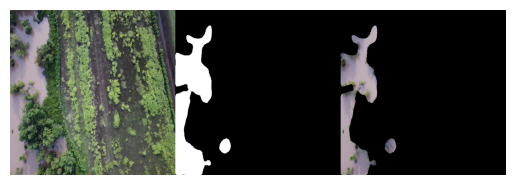

100/100 ━━━━━━━━━━━━━━━━━━━━ 387s 4s/step - accuracy: 0.9564 - loss: 0.2980 - mean_iou: 0.5367 - val_accuracy: 0.9233 - val_loss: 0.5674 - val_mean_iou: 0.4866
Epoch 63/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9655 - loss: 0.2625 - mean_iou: 0.5915i= 63 loss= 0.2880627512931824 val_loss= 0.44122380018234253 mean_iou= 0.5567164421081543 val_mean_iou= 0.5233132243156433
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


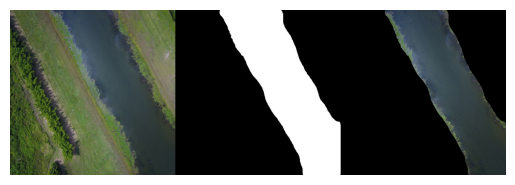

100/100 ━━━━━━━━━━━━━━━━━━━━ 410s 4s/step - accuracy: 0.9655 - loss: 0.2628 - mean_iou: 0.5912 - val_accuracy: 0.9314 - val_loss: 0.4412 - val_mean_iou: 0.5233
Epoch 64/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9642 - loss: 0.2905 - mean_iou: 0.5307i= 64 loss= 0.3065648674964905 val_loss= 0.6023663282394409 mean_iou= 0.5370662212371826 val_mean_iou= 0.39103877544403076
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


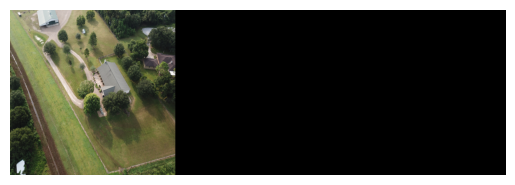

100/100 ━━━━━━━━━━━━━━━━━━━━ 420s 4s/step - accuracy: 0.9642 - loss: 0.2907 - mean_iou: 0.5308 - val_accuracy: 0.9324 - val_loss: 0.6024 - val_mean_iou: 0.3910
Epoch 65/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9589 - loss: 0.3012 - mean_iou: 0.5497i= 65 loss= 0.3015683591365814 val_loss= 0.5283644199371338 mean_iou= 0.53519606590271 val_mean_iou= 0.5095383524894714
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


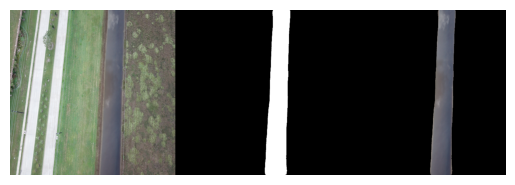

100/100 ━━━━━━━━━━━━━━━━━━━━ 417s 4s/step - accuracy: 0.9589 - loss: 0.3012 - mean_iou: 0.5495 - val_accuracy: 0.9328 - val_loss: 0.5284 - val_mean_iou: 0.5095
Epoch 66/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9587 - loss: 0.2769 - mean_iou: 0.5460i= 66 loss= 0.2774845361709595 val_loss= 0.5164728164672852 mean_iou= 0.5652824640274048 val_mean_iou= 0.4993402063846588
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


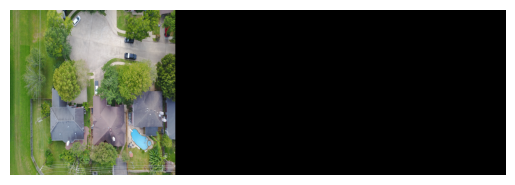

100/100 ━━━━━━━━━━━━━━━━━━━━ 411s 4s/step - accuracy: 0.9587 - loss: 0.2769 - mean_iou: 0.5462 - val_accuracy: 0.9278 - val_loss: 0.5165 - val_mean_iou: 0.4993
Epoch 67/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9647 - loss: 0.2699 - mean_iou: 0.5272i= 67 loss= 0.26592540740966797 val_loss= 0.5475625395774841 mean_iou= 0.545965850353241 val_mean_iou= 0.49023622274398804
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


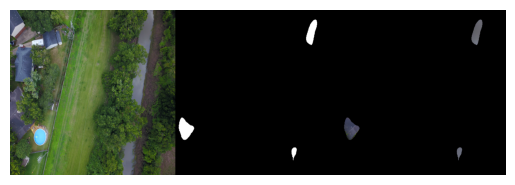

100/100 ━━━━━━━━━━━━━━━━━━━━ 365s 4s/step - accuracy: 0.9647 - loss: 0.2699 - mean_iou: 0.5273 - val_accuracy: 0.9198 - val_loss: 0.5476 - val_mean_iou: 0.4902
Epoch 68/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9595 - loss: 0.2709 - mean_iou: 0.5607i= 68 loss= 0.2773640751838684 val_loss= 0.46356192231178284 mean_iou= 0.5654217600822449 val_mean_iou= 0.4697898328304291
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


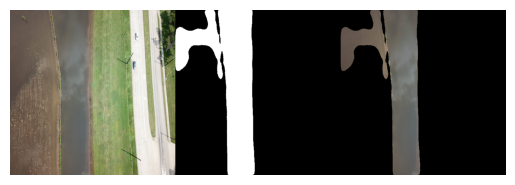

100/100 ━━━━━━━━━━━━━━━━━━━━ 409s 4s/step - accuracy: 0.9595 - loss: 0.2710 - mean_iou: 0.5608 - val_accuracy: 0.9364 - val_loss: 0.4636 - val_mean_iou: 0.4698
Epoch 69/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9639 - loss: 0.2699 - mean_iou: 0.5621i= 69 loss= 0.26779061555862427 val_loss= 0.5423048734664917 mean_iou= 0.5588740110397339 val_mean_iou= 0.4767485558986664
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


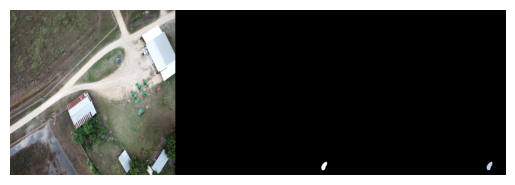

100/100 ━━━━━━━━━━━━━━━━━━━━ 419s 4s/step - accuracy: 0.9639 - loss: 0.2699 - mean_iou: 0.5621 - val_accuracy: 0.9231 - val_loss: 0.5423 - val_mean_iou: 0.4767
Epoch 70/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9671 - loss: 0.2711 - mean_iou: 0.5794i= 70 loss= 0.25764352083206177 val_loss= 0.499565064907074 mean_iou= 0.575664758682251 val_mean_iou= 0.47677892446517944
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


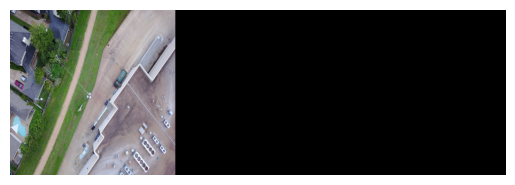

100/100 ━━━━━━━━━━━━━━━━━━━━ 412s 4s/step - accuracy: 0.9671 - loss: 0.2709 - mean_iou: 0.5794 - val_accuracy: 0.9269 - val_loss: 0.4996 - val_mean_iou: 0.4768
Epoch 71/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.9623 - loss: 0.2709 - mean_iou: 0.5771i= 71 loss= 0.2936646342277527 val_loss= 0.39000260829925537 mean_iou= 0.5743582248687744 val_mean_iou= 0.4840010106563568
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


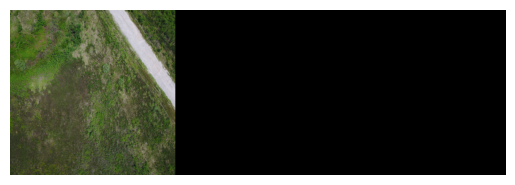

100/100 ━━━━━━━━━━━━━━━━━━━━ 717s 7s/step - accuracy: 0.9623 - loss: 0.2711 - mean_iou: 0.5771 - val_accuracy: 0.9481 - val_loss: 0.3900 - val_mean_iou: 0.4840
Epoch 72/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9646 - loss: 0.2589 - mean_iou: 0.5603i= 72 loss= 0.2713925242424011 val_loss= 0.5100851058959961 mean_iou= 0.5622491240501404 val_mean_iou= 0.5050299763679504
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


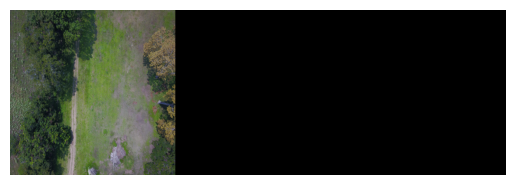

100/100 ━━━━━━━━━━━━━━━━━━━━ 406s 4s/step - accuracy: 0.9646 - loss: 0.2590 - mean_iou: 0.5604 - val_accuracy: 0.9279 - val_loss: 0.5101 - val_mean_iou: 0.5050
Epoch 73/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9669 - loss: 0.2427 - mean_iou: 0.5924i= 73 loss= 0.2629464566707611 val_loss= 0.4605391025543213 mean_iou= 0.579605221748352 val_mean_iou= 0.46875572204589844
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


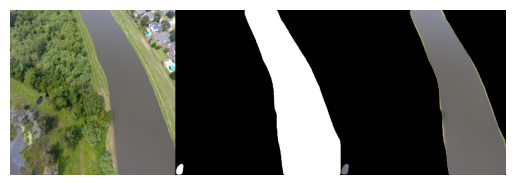

100/100 ━━━━━━━━━━━━━━━━━━━━ 412s 4s/step - accuracy: 0.9669 - loss: 0.2429 - mean_iou: 0.5923 - val_accuracy: 0.9438 - val_loss: 0.4605 - val_mean_iou: 0.4688
Epoch 74/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9656 - loss: 0.2439 - mean_iou: 0.6276i= 74 loss= 0.2511061131954193 val_loss= 0.517424464225769 mean_iou= 0.5958139896392822 val_mean_iou= 0.48448261618614197
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


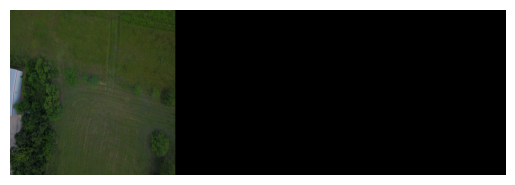

100/100 ━━━━━━━━━━━━━━━━━━━━ 414s 4s/step - accuracy: 0.9656 - loss: 0.2440 - mean_iou: 0.6273 - val_accuracy: 0.9246 - val_loss: 0.5174 - val_mean_iou: 0.4845
Epoch 75/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9662 - loss: 0.2463 - mean_iou: 0.5677i= 75 loss= 0.2412099689245224 val_loss= 0.4614424705505371 mean_iou= 0.5783265233039856 val_mean_iou= 0.5400708317756653
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step


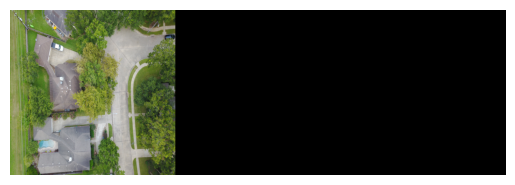

100/100 ━━━━━━━━━━━━━━━━━━━━ 424s 4s/step - accuracy: 0.9662 - loss: 0.2462 - mean_iou: 0.5678 - val_accuracy: 0.9314 - val_loss: 0.4614 - val_mean_iou: 0.5401
Epoch 76/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9609 - loss: 0.2816 - mean_iou: 0.5558i= 76 loss= 0.2892623543739319 val_loss= 0.5915153622627258 mean_iou= 0.5452216863632202 val_mean_iou= 0.5146622657775879
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


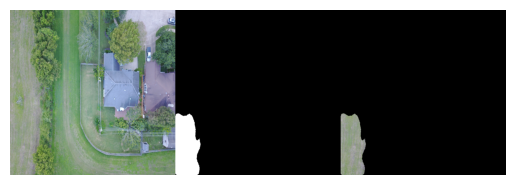

100/100 ━━━━━━━━━━━━━━━━━━━━ 415s 4s/step - accuracy: 0.9609 - loss: 0.2817 - mean_iou: 0.5557 - val_accuracy: 0.9107 - val_loss: 0.5915 - val_mean_iou: 0.5147
Epoch 77/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9494 - loss: 0.4078 - mean_iou: 0.4755i= 77 loss= 0.3905976116657257 val_loss= 0.4126320779323578 mean_iou= 0.5057022571563721 val_mean_iou= 0.5003701448440552
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


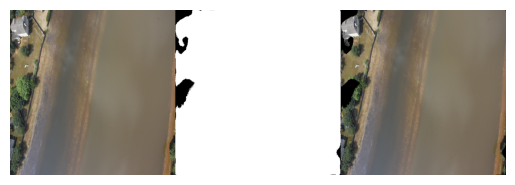

100/100 ━━━━━━━━━━━━━━━━━━━━ 428s 4s/step - accuracy: 0.9494 - loss: 0.4077 - mean_iou: 0.4758 - val_accuracy: 0.9397 - val_loss: 0.4126 - val_mean_iou: 0.5004
Epoch 78/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9658 - loss: 0.2626 - mean_iou: 0.5564i= 78 loss= 0.27344855666160583 val_loss= 0.4919276237487793 mean_iou= 0.5545427799224854 val_mean_iou= 0.5065745711326599
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


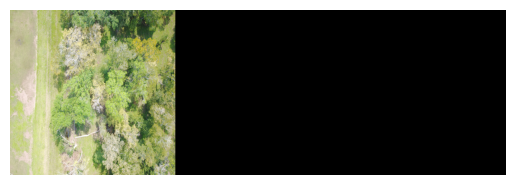

100/100 ━━━━━━━━━━━━━━━━━━━━ 352s 4s/step - accuracy: 0.9657 - loss: 0.2627 - mean_iou: 0.5563 - val_accuracy: 0.9272 - val_loss: 0.4919 - val_mean_iou: 0.5066
Epoch 79/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9668 - loss: 0.2432 - mean_iou: 0.5453i= 79 loss= 0.24536514282226562 val_loss= 0.5618560910224915 mean_iou= 0.5475316643714905 val_mean_iou= 0.4886525273323059
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


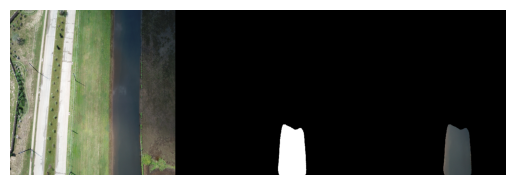

100/100 ━━━━━━━━━━━━━━━━━━━━ 348s 4s/step - accuracy: 0.9669 - loss: 0.2432 - mean_iou: 0.5453 - val_accuracy: 0.9229 - val_loss: 0.5619 - val_mean_iou: 0.4887
Epoch 80/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9642 - loss: 0.2987 - mean_iou: 0.5582i= 80 loss= 0.28150299191474915 val_loss= 0.5534582138061523 mean_iou= 0.5693421363830566 val_mean_iou= 0.4936021864414215
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


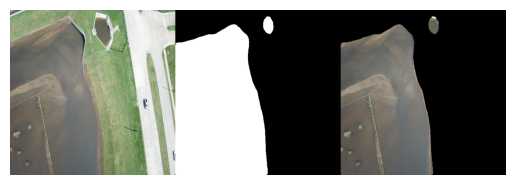

100/100 ━━━━━━━━━━━━━━━━━━━━ 405s 4s/step - accuracy: 0.9642 - loss: 0.2986 - mean_iou: 0.5583 - val_accuracy: 0.9378 - val_loss: 0.5535 - val_mean_iou: 0.4936
Epoch 81/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9621 - loss: 0.2975 - mean_iou: 0.5404i= 81 loss= 0.2908294200897217 val_loss= 0.4015897810459137 mean_iou= 0.5406935214996338 val_mean_iou= 0.5051098465919495
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


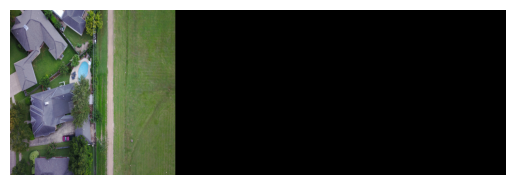

100/100 ━━━━━━━━━━━━━━━━━━━━ 472s 5s/step - accuracy: 0.9621 - loss: 0.2975 - mean_iou: 0.5404 - val_accuracy: 0.9496 - val_loss: 0.4016 - val_mean_iou: 0.5051
Epoch 82/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9639 - loss: 0.2651 - mean_iou: 0.5665i= 82 loss= 0.25979018211364746 val_loss= 0.5931040048599243 mean_iou= 0.5681822299957275 val_mean_iou= 0.47018304467201233
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


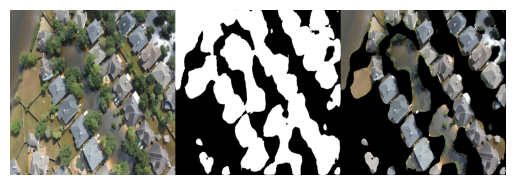

100/100 ━━━━━━━━━━━━━━━━━━━━ 433s 4s/step - accuracy: 0.9639 - loss: 0.2651 - mean_iou: 0.5665 - val_accuracy: 0.9301 - val_loss: 0.5931 - val_mean_iou: 0.4702
Epoch 83/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.9686 - loss: 0.2304 - mean_iou: 0.5613i= 83 loss= 0.21553216874599457 val_loss= 0.408691942691803 mean_iou= 0.577290415763855 val_mean_iou= 0.537441611289978
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


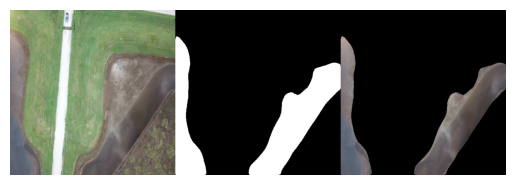

100/100 ━━━━━━━━━━━━━━━━━━━━ 670s 7s/step - accuracy: 0.9687 - loss: 0.2303 - mean_iou: 0.5615 - val_accuracy: 0.9401 - val_loss: 0.4087 - val_mean_iou: 0.5374
Epoch 84/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9607 - loss: 0.2622 - mean_iou: 0.5785i= 84 loss= 0.23781102895736694 val_loss= 0.42323389649391174 mean_iou= 0.5876912474632263 val_mean_iou= 0.5495091080665588
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


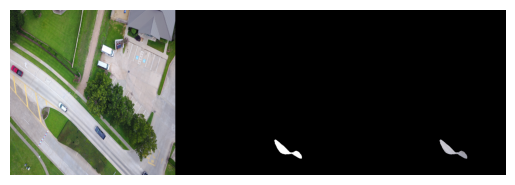

100/100 ━━━━━━━━━━━━━━━━━━━━ 509s 5s/step - accuracy: 0.9607 - loss: 0.2620 - mean_iou: 0.5786 - val_accuracy: 0.9405 - val_loss: 0.4232 - val_mean_iou: 0.5495
Epoch 85/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9630 - loss: 0.2402 - mean_iou: 0.5856i= 85 loss= 0.2635228633880615 val_loss= 0.41733384132385254 mean_iou= 0.6007715463638306 val_mean_iou= 0.47582903504371643
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


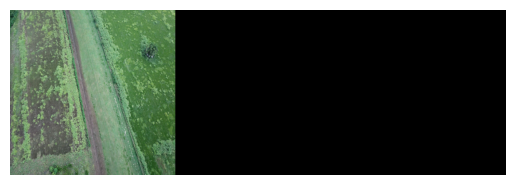

100/100 ━━━━━━━━━━━━━━━━━━━━ 540s 5s/step - accuracy: 0.9630 - loss: 0.2404 - mean_iou: 0.5857 - val_accuracy: 0.9386 - val_loss: 0.4173 - val_mean_iou: 0.4758
Epoch 86/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9627 - loss: 0.2546 - mean_iou: 0.5698i= 86 loss= 0.2647168040275574 val_loss= 0.47885388135910034 mean_iou= 0.5688768625259399 val_mean_iou= 0.5102663040161133
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


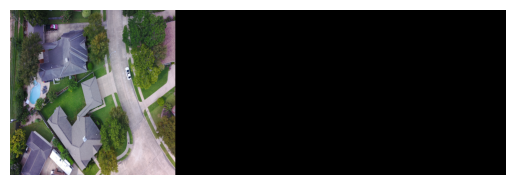

100/100 ━━━━━━━━━━━━━━━━━━━━ 429s 4s/step - accuracy: 0.9627 - loss: 0.2547 - mean_iou: 0.5698 - val_accuracy: 0.9476 - val_loss: 0.4789 - val_mean_iou: 0.5103
Epoch 87/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9695 - loss: 0.2379 - mean_iou: 0.5717i= 87 loss= 0.24169453978538513 val_loss= 0.5178304314613342 mean_iou= 0.584278404712677 val_mean_iou= 0.4761298596858978
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


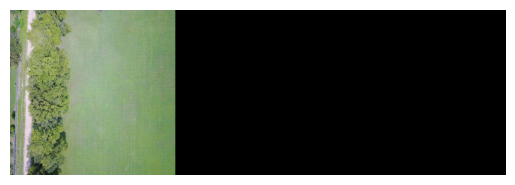

100/100 ━━━━━━━━━━━━━━━━━━━━ 431s 4s/step - accuracy: 0.9695 - loss: 0.2379 - mean_iou: 0.5718 - val_accuracy: 0.9371 - val_loss: 0.5178 - val_mean_iou: 0.4761
Epoch 88/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9666 - loss: 0.2498 - mean_iou: 0.5873i= 88 loss= 0.23508058488368988 val_loss= 0.4366295337677002 mean_iou= 0.5934929251670837 val_mean_iou= 0.4879752993583679
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


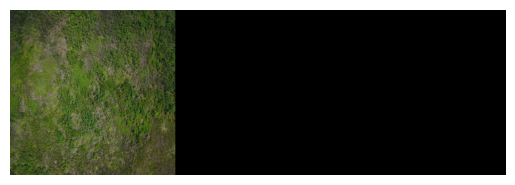

100/100 ━━━━━━━━━━━━━━━━━━━━ 430s 4s/step - accuracy: 0.9666 - loss: 0.2497 - mean_iou: 0.5874 - val_accuracy: 0.9339 - val_loss: 0.4366 - val_mean_iou: 0.4880
Epoch 89/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9681 - loss: 0.2120 - mean_iou: 0.5672i= 89 loss= 0.20578761398792267 val_loss= 0.4461615979671478 mean_iou= 0.5917099118232727 val_mean_iou= 0.4857816696166992
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


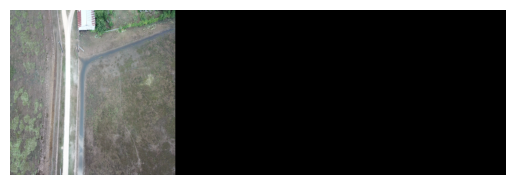

100/100 ━━━━━━━━━━━━━━━━━━━━ 438s 4s/step - accuracy: 0.9681 - loss: 0.2119 - mean_iou: 0.5675 - val_accuracy: 0.9314 - val_loss: 0.4462 - val_mean_iou: 0.4858
Epoch 90/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9724 - loss: 0.1980 - mean_iou: 0.5999i= 90 loss= 0.22594670951366425 val_loss= 0.5048283934593201 mean_iou= 0.5794997215270996 val_mean_iou= 0.49157875776290894
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


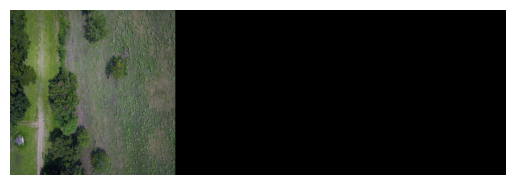

100/100 ━━━━━━━━━━━━━━━━━━━━ 431s 4s/step - accuracy: 0.9724 - loss: 0.1982 - mean_iou: 0.5997 - val_accuracy: 0.9277 - val_loss: 0.5048 - val_mean_iou: 0.4916
Epoch 91/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9645 - loss: 0.2591 - mean_iou: 0.5886i= 91 loss= 0.23324176669120789 val_loss= 0.5186582207679749 mean_iou= 0.6016132235527039 val_mean_iou= 0.48361387848854065
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


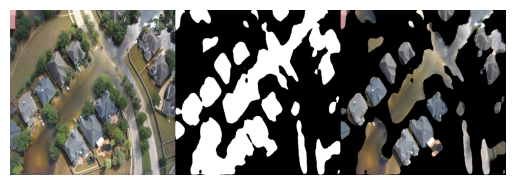

100/100 ━━━━━━━━━━━━━━━━━━━━ 435s 4s/step - accuracy: 0.9646 - loss: 0.2588 - mean_iou: 0.5887 - val_accuracy: 0.9298 - val_loss: 0.5187 - val_mean_iou: 0.4836
Epoch 92/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9676 - loss: 0.2345 - mean_iou: 0.5832i= 92 loss= 0.21925987303256989 val_loss= 0.37590348720550537 mean_iou= 0.5643354654312134 val_mean_iou= 0.4905887544155121
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


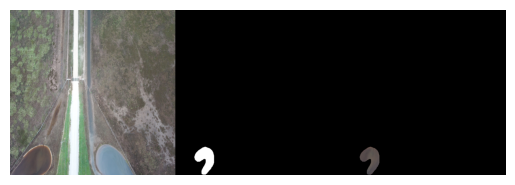

100/100 ━━━━━━━━━━━━━━━━━━━━ 438s 4s/step - accuracy: 0.9676 - loss: 0.2344 - mean_iou: 0.5831 - val_accuracy: 0.9497 - val_loss: 0.3759 - val_mean_iou: 0.4906
Epoch 93/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9715 - loss: 0.2176 - mean_iou: 0.6119i= 93 loss= 0.215656578540802 val_loss= 0.5377947092056274 mean_iou= 0.5788062810897827 val_mean_iou= 0.4962625503540039
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


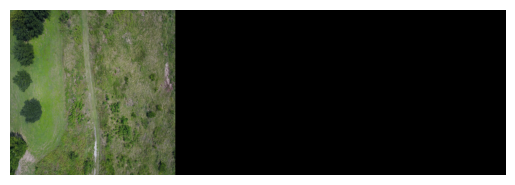

100/100 ━━━━━━━━━━━━━━━━━━━━ 433s 4s/step - accuracy: 0.9715 - loss: 0.2176 - mean_iou: 0.6116 - val_accuracy: 0.9355 - val_loss: 0.5378 - val_mean_iou: 0.4963
Epoch 94/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9707 - loss: 0.2099 - mean_iou: 0.6079i= 94 loss= 0.20414899289608002 val_loss= 0.4586617350578308 mean_iou= 0.5994821190834045 val_mean_iou= 0.4821428656578064
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


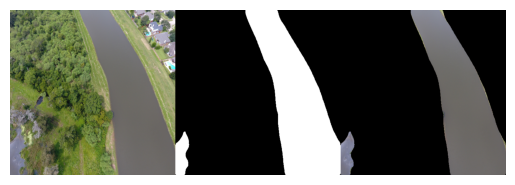

100/100 ━━━━━━━━━━━━━━━━━━━━ 433s 4s/step - accuracy: 0.9707 - loss: 0.2099 - mean_iou: 0.6078 - val_accuracy: 0.9517 - val_loss: 0.4587 - val_mean_iou: 0.4821
Epoch 95/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9732 - loss: 0.2106 - mean_iou: 0.6031i= 95 loss= 0.19285152852535248 val_loss= 0.4185628890991211 mean_iou= 0.5970370769500732 val_mean_iou= 0.49604830145835876
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step


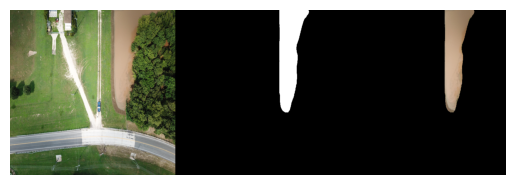

100/100 ━━━━━━━━━━━━━━━━━━━━ 433s 4s/step - accuracy: 0.9732 - loss: 0.2104 - mean_iou: 0.6031 - val_accuracy: 0.9454 - val_loss: 0.4186 - val_mean_iou: 0.4960
Epoch 96/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9725 - loss: 0.2185 - mean_iou: 0.5935i= 96 loss= 0.22806672751903534 val_loss= 0.47023358941078186 mean_iou= 0.5961859226226807 val_mean_iou= 0.4982564449310303
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


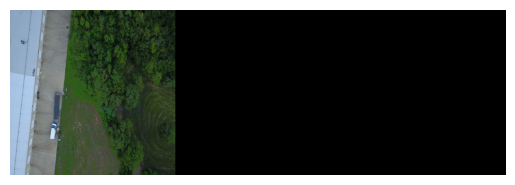

100/100 ━━━━━━━━━━━━━━━━━━━━ 434s 4s/step - accuracy: 0.9725 - loss: 0.2186 - mean_iou: 0.5935 - val_accuracy: 0.9262 - val_loss: 0.4702 - val_mean_iou: 0.4983
Epoch 97/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9764 - loss: 0.1840 - mean_iou: 0.5919i= 97 loss= 0.1928100734949112 val_loss= 0.5197187066078186 mean_iou= 0.5879217982292175 val_mean_iou= 0.49053215980529785
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step


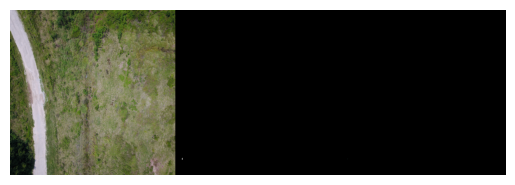

100/100 ━━━━━━━━━━━━━━━━━━━━ 433s 4s/step - accuracy: 0.9763 - loss: 0.1841 - mean_iou: 0.5919 - val_accuracy: 0.9360 - val_loss: 0.5197 - val_mean_iou: 0.4905
Epoch 98/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9724 - loss: 0.1981 - mean_iou: 0.5784i= 98 loss= 0.20480774343013763 val_loss= 0.48753827810287476 mean_iou= 0.5813471078872681 val_mean_iou= 0.47037678956985474
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


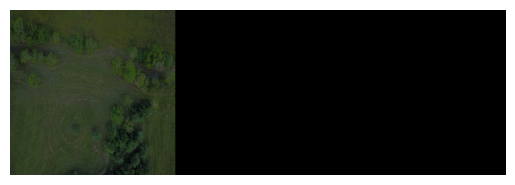

100/100 ━━━━━━━━━━━━━━━━━━━━ 434s 4s/step - accuracy: 0.9724 - loss: 0.1981 - mean_iou: 0.5784 - val_accuracy: 0.9418 - val_loss: 0.4875 - val_mean_iou: 0.4704
Epoch 99/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9747 - loss: 0.1938 - mean_iou: 0.5778i= 99 loss= 0.20051582157611847 val_loss= 0.5382422804832458 mean_iou= 0.5724802017211914 val_mean_iou= 0.4498714506626129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


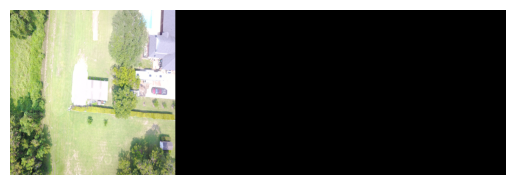

100/100 ━━━━━━━━━━━━━━━━━━━━ 434s 4s/step - accuracy: 0.9747 - loss: 0.1938 - mean_iou: 0.5777 - val_accuracy: 0.9275 - val_loss: 0.5382 - val_mean_iou: 0.4499
Epoch 100/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9705 - loss: 0.2146 - mean_iou: 0.5898i= 100 loss= 0.20052868127822876 val_loss= 0.4711187779903412 mean_iou= 0.6097427606582642 val_mean_iou= 0.48040971159935
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


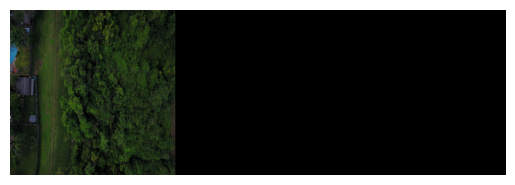

100/100 ━━━━━━━━━━━━━━━━━━━━ 438s 4s/step - accuracy: 0.9705 - loss: 0.2145 - mean_iou: 0.5900 - val_accuracy: 0.9408 - val_loss: 0.4711 - val_mean_iou: 0.4804


In [65]:
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

model.compile(optimizer=Adam(learning_rate=5e-5),
              loss=combined_loss,
              metrics=['accuracy', mean_iou])


callbacks = build_callbacks()

history = model.fit(train_gen, validation_data=val_gen, steps_per_epoch=100, validation_steps=20, epochs=100, callbacks=callbacks)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


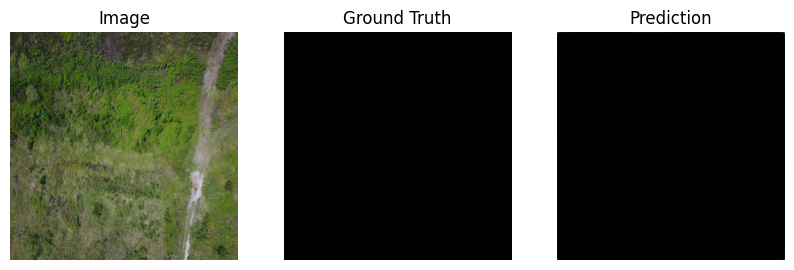

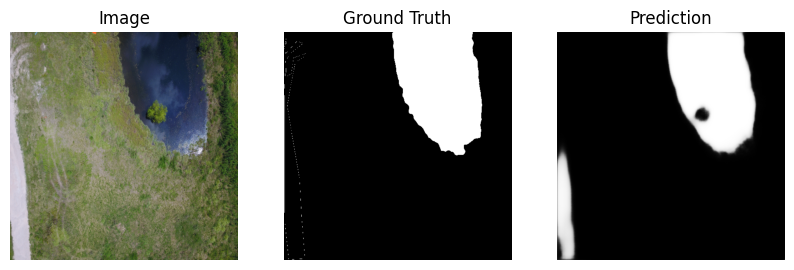

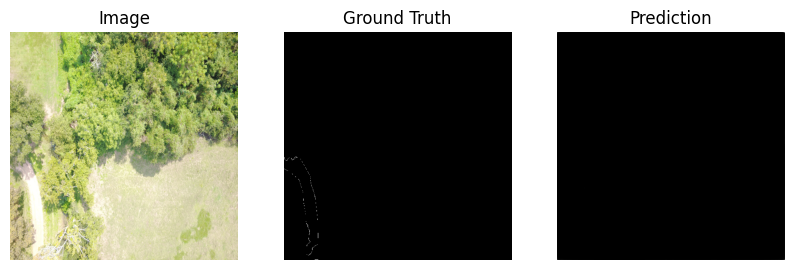

In [66]:
import matplotlib.pyplot as plt

x_sample, y_sample = next(val_gen)
pred = model.predict(x_sample)

for i in range(3):
    plt.figure(figsize=(10, 3))
    plt.subplot(1, 3, 1)
    plt.imshow(x_sample[i])
    plt.title("Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(y_sample[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(pred[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')
    plt.show()


In [67]:
model = unet()  # rebuild architecture
model.load_weights("unet.weights.h5")  # load trained weights


E:\7thsem\Artificial_intelligence\Disaster-Risk_management_repo\disaster-risk-env\Lib\site-packages\keras\src\saving\saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 2 variables whereas the saved optimizer has 134 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


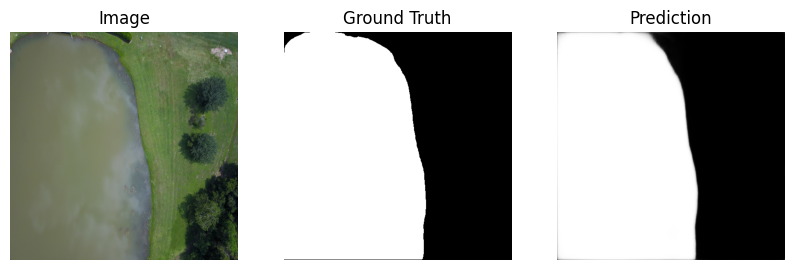

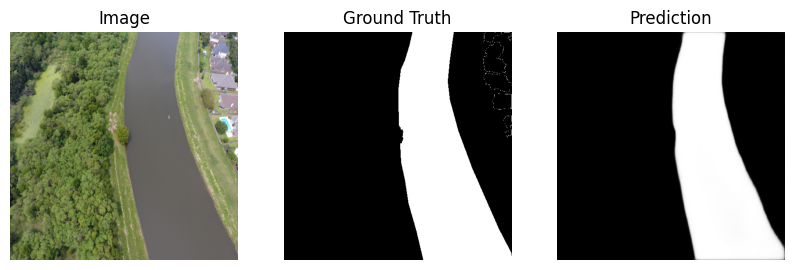

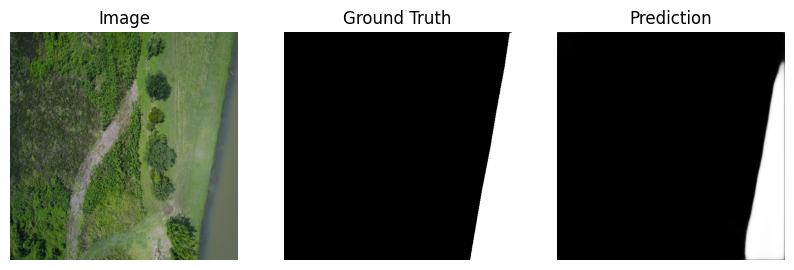

In [68]:
import matplotlib.pyplot as plt

x_sample, y_sample = next(val_gen)
pred = model.predict(x_sample)

for i in range(3):
    plt.figure(figsize=(10, 3))
    plt.subplot(1, 3, 1)
    plt.imshow(x_sample[i])
    plt.title("Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(y_sample[i].squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(pred[i].squeeze(), cmap='gray')
    plt.title("Prediction")
    plt.axis('off')
    plt.show()
